<a href="https://colab.research.google.com/github/rofiiiee/code/blob/main/Code1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import files
files.upload()  # اختر ملف kaggle.json من جهازك

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"rahafosama","key":"c01c5bd5c9c7f141d7674b96edb3eb84"}'}

In [ ]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!kaggle datasets list

ref                                                                    title                                                size  lastUpdated          downloadCount  voteCount  usabilityRating  
---------------------------------------------------------------------  --------------------------------------------------  -----  -------------------  -------------  ---------  ---------------  
bhadramohit/customer-shopping-latest-trends-dataset                    Customer Shopping (Latest Trends) Dataset            76KB  2024-11-23 15:26:12          14817        289  1.0              
hopesb/student-depression-dataset                                      Student Depression Dataset.                         454KB  2024-11-22 17:56:03          11495        148  1.0              
rashminslnk/youtube-subscribers-data-2024                              Youtube Subscribers Data 2024                         1KB  2024-12-06 12:10:46           1601         32  1.0              
jamiedcollins/hjsjdjdjdjd

In [ ]:
!kaggle datasets download -d puneet6060/intel-image-classification

Dataset URL: https://www.kaggle.com/datasets/puneet6060/intel-image-classification
License(s): copyright-authors
intel-image-classification.zip: Skipping, found more recently modified local copy (use --force to force download)


In [ ]:
import zipfile
with zipfile.ZipFile("intel-image-classification.zip", 'r') as zip_ref:
    zip_ref.extractall("intel-image-classification")

Checkpoint loaded: {'step': 100}


In [ ]:
import os
os.listdir("intel-image-classification")

['seg_test', 'seg_train', 'seg_pred']

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set(style="whitegrid")
import os
import glob as gb
import cv2
import tensorflow as tf
import keras
from tensorflow import keras
from tensorflow.keras import layers, regularizers

In [ ]:
trainpath = 'intel-image-classification/seg_train/'

for folder in  os.listdir(trainpath + 'seg_train') :
    files = gb.glob(pathname= str( trainpath +'seg_train//' + folder + '/*.jpg'))
    print(f'For training data , found {len(files)} in folder {folder}')

For training data , found 2274 in folder sea
For training data , found 2404 in folder glacier
For training data , found 2271 in folder forest
For training data , found 2191 in folder buildings
For training data , found 2382 in folder street
For training data , found 2512 in folder mountain


In [ ]:
testpath = 'intel-image-classification/seg_test/'

for folder in  os.listdir(testpath +'seg_test') :
    files = gb.glob(pathname= str( testpath +'seg_test//' + folder + '/*.jpg'))
    print(f'For testing data , found {len(files)} in folder {folder}')

For testing data , found 510 in folder sea
For testing data , found 553 in folder glacier
For testing data , found 474 in folder forest
For testing data , found 437 in folder buildings
For testing data , found 501 in folder street
For testing data , found 525 in folder mountain


In [ ]:
predpath = 'intel-image-classification/seg_pred/'

files = gb.glob(pathname= str(predpath +'seg_pred/*.jpg'))
print(f'For Prediction data , found {len(files)}')

For Prediction data , found 7301


_____

# Checking Images

now we need to heck the images sizes , to know ow they looks like

since we have 6 categories , we first need to create a dictionary with their names & indices , also create a function to get the code back


In [ ]:
code = {'buildings':0 ,'forest':1,'glacier':2,'mountain':3,'sea':4,'street':5}

def getcode(n) :
    for x , y in code.items() :
        if n == y :
            return x

In [ ]:
size = []
for folder in  os.listdir(trainpath +'seg_train') :
    files = gb.glob(pathname= str( trainpath +'seg_train//' + folder + '/*.jpg'))
    for file in files:
        image = plt.imread(file)
        size.append(image.shape)
pd.Series(size).value_counts()

,count
"(150, 150, 3)",13986
"(113, 150, 3)",7
"(135, 150, 3)",3
"(111, 150, 3)",3
"(134, 150, 3)",2
"(142, 150, 3)",2
"(123, 150, 3)",2
"(143, 150, 3)",2
"(146, 150, 3)",2
"(136, 150, 3)",2


In [ ]:
size = []
for folder in  os.listdir(testpath +'seg_test') :
    files = gb.glob(pathname= str( testpath +'seg_test//' + folder + '/*.jpg'))
    for file in files:
        image = plt.imread(file)
        size.append(image.shape)
pd.Series(size).value_counts()

,count
"(150, 150, 3)",2993
"(110, 150, 3)",1
"(149, 150, 3)",1
"(72, 150, 3)",1
"(76, 150, 3)",1
"(141, 150, 3)",1
"(81, 150, 3)",1
"(131, 150, 3)",1


In [ ]:
size = []
files = gb.glob(pathname= str(predpath +'seg_pred/*.jpg'))
for file in files:
    image = plt.imread(file)
    size.append(image.shape)
pd.Series(size).value_counts()

,count
"(150, 150, 3)",7288
"(149, 150, 3)",1
"(126, 150, 3)",1
"(124, 150, 3)",1
"(139, 150, 3)",1
"(374, 500, 3)",1
"(144, 150, 3)",1
"(100, 150, 3)",1
"(112, 150, 3)",1
"(143, 150, 3)",1


# Reading Images

now it's time to read all images & convert it into arrays

first we'll create a variable s , which refer to size , so we can change it easily

let's use now size = 100 , so it will be suitable amount to contain accuracy without losing so much time in training

In [ ]:
s = 100

In [ ]:
X_train = []
y_train = []
for folder in  os.listdir(trainpath +'seg_train') :
    files = gb.glob(pathname= str( trainpath +'seg_train//' + folder + '/*.jpg'))
    for file in files:
        image = cv2.imread(file)
        image_array = cv2.resize(image , (s,s))
        X_train.append(list(image_array))
        y_train.append(code[folder])

In [ ]:
print(f'we have {len(X_train)} items in X_train')

we have 14034 items in X_train


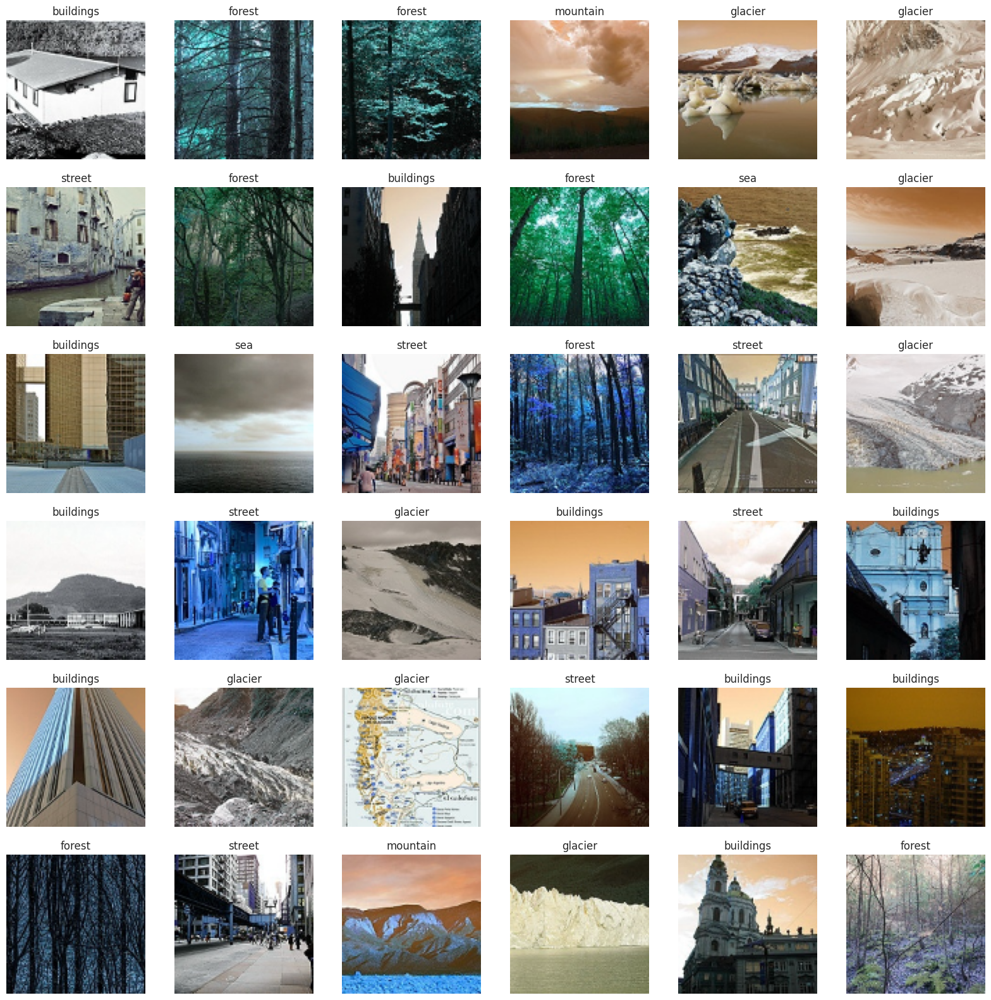

In [ ]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_train),36))) :
    plt.subplot(6,6,n+1)
    plt.imshow(X_train[i])
    plt.axis('off')
    plt.title(getcode(y_train[i]))

In [ ]:
X_test = []
y_test = []
for folder in  os.listdir(testpath +'seg_test') :
    files = gb.glob(pathname= str(testpath + 'seg_test//' + folder + '/*.jpg'))
    for file in files:
        image = cv2.imread(file)
        image_array = cv2.resize(image , (s,s))
        X_test.append(list(image_array))
        y_test.append(code[folder])

In [ ]:
print(f'we have {len(X_test)} items in X_test')

we have 3000 items in X_test


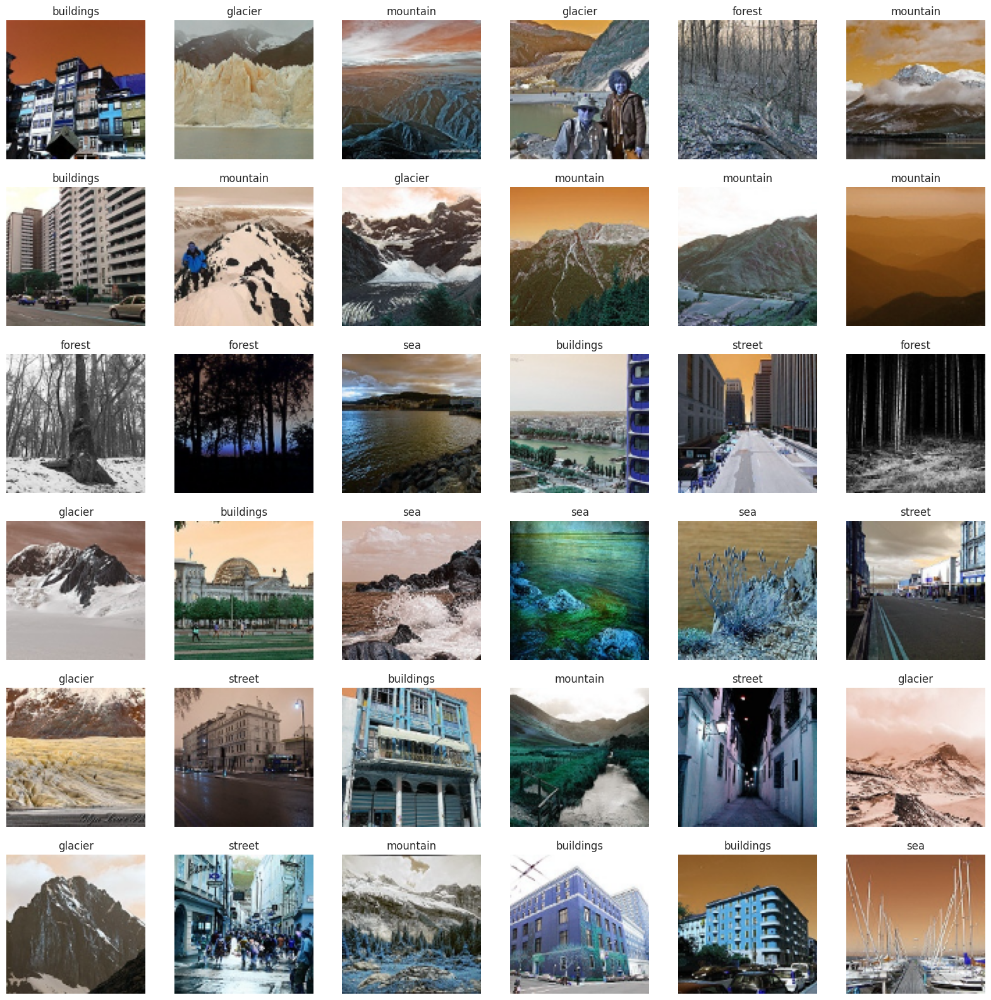

In [ ]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_test),36))) :
    plt.subplot(6,6,n+1)
    plt.imshow(X_test[i])
    plt.axis('off')
    plt.title(getcode(y_test[i]))

In [ ]:
X_pred = []
files = gb.glob(pathname= str(predpath + 'seg_pred/*.jpg'))
for file in files:
    image = cv2.imread(file)
    image_array = cv2.resize(image , (s,s))
    X_pred.append(list(image_array))

In [ ]:
print(f'we have {len(X_pred)} items in X_pred')

we have 7301 items in X_pred


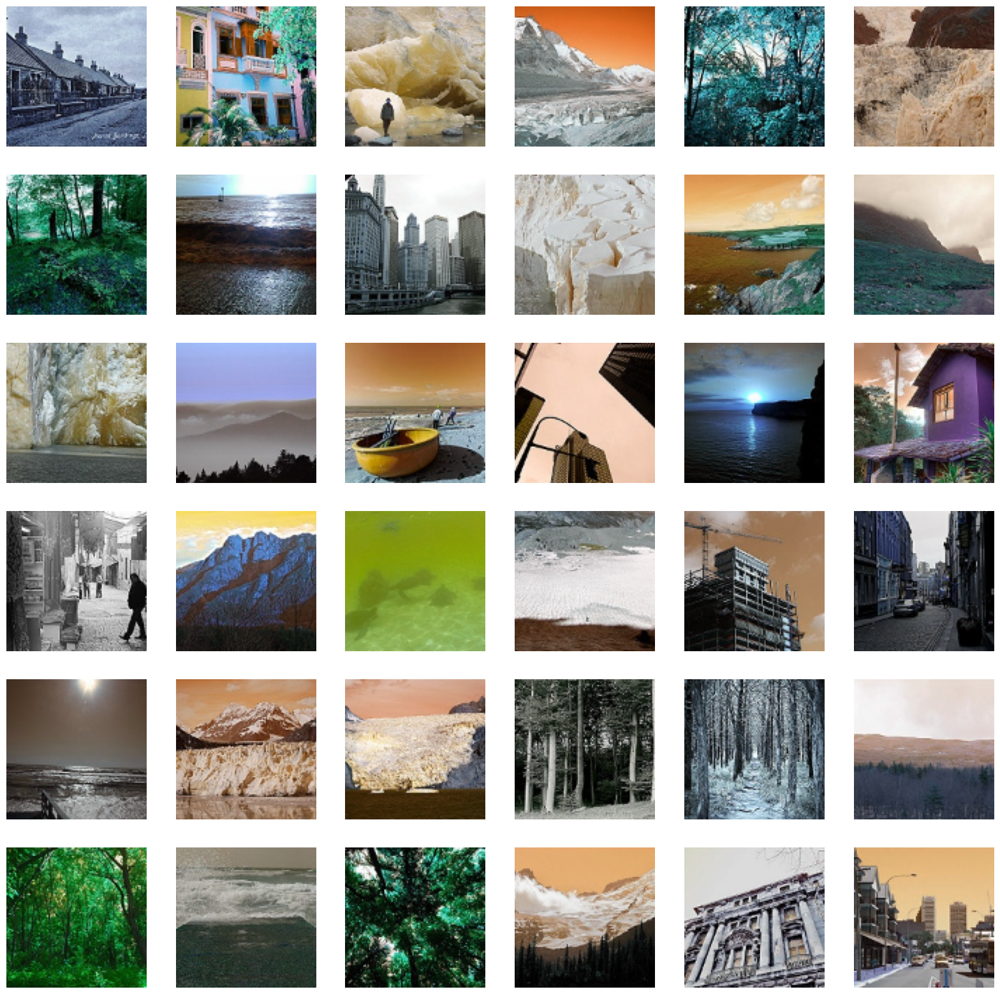

In [ ]:
plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_pred),36))) :
    plt.subplot(6,6,n+1)
    plt.imshow(X_pred[i])
    plt.axis('off')

________

# Building The Model

now we need to build the model to train our data

first to convert the data into arrays using numpy


In [ ]:
X_train = np.array(X_train)
X_test = np.array(X_test)
X_pred_array = np.array(X_pred)
y_train = np.array(y_train)
y_test = np.array(y_test)

print(f'X_train shape  is {X_train.shape}')
print(f'X_test shape  is {X_test.shape}')
print(f'X_pred shape  is {X_pred_array.shape}')
print(f'y_train shape  is {y_train.shape}')
print(f'y_test shape  is {y_test.shape}')

NameError: name 'np' is not defined

In [ ]:
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)


In [ ]:
print(f'X_train shape is {X_train.shape}')
print(f'X_val shape is {X_val.shape}')
print(f'X_test shape is {X_test.shape}')
print(f'y_train shape is {y_train.shape}')
print(f'y_val shape is {y_val.shape}')
print(f'y_test shape is {y_test.shape}')
print(f'X_pred shape  is {X_pred_array.shape}')

X_train shape is (11227, 100, 100, 3)
X_val shape is (2807, 100, 100, 3)
X_test shape is (3000, 100, 100, 3)
y_train shape is (11227,)
y_val shape is (2807,)
y_test shape is (3000,)
X_pred shape  is (7301, 100, 100, 3)




now to build the CNN model by Keras , using Conv2D layers , MaxPooling & Denses


In [ ]:
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, Dropout, Flatten
from tensorflow.keras import regularizers

# Define the input shape
input_shape = (s, s, 3)

# Load ResNet50 with pretrained weights (without the top layer)
base_model = ResNet50(weights='imagenet', include_top=False, input_shape=input_shape)

# Freeze the base model layers
base_model.trainable = False

# Build the custom model on top of ResNet
inputs = Input(shape=input_shape)
x = base_model(inputs, training=False)  # Use the base model
x = Flatten()(x)
x = Dense(128, activation='relu', kernel_regularizer=regularizers.l2(0.01))(x)
x = Dropout(0.5)(x)
x = Dense(64, activation='relu', kernel_regularizer=regularizers.l2(0.01))(x)
x = Dropout(0.5)(x)
outputs = Dense(6, activation='softmax')(x)  # Assuming 6 classes

# Create the model
ResNetModel = Model(inputs, outputs)

# Compile the model
ResNetModel.compile(optimizer='adam',
                    loss='sparse_categorical_crossentropy',
                    metrics=['accuracy'])

# Summary of the model
ResNetModel.summary()


Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)           │ (None, 100, 100, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ resnet50 (Functional)                │ (None, 4, 4, 2048)          │      23,587,712 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_1 (Flatten)                  │ (None, 32768)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 128)                 │       4,194,432 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 64)                  │           8,256 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 6)                   │             390 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 27,790,790 (106.01 MB)

 Trainable params: 4,203,078 (16.03 MB)

 Non-trainable params: 23,587,712 (89.98 MB)

In [ ]:
# # Compile the model
# KerasModel.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

NameError: name 'KerasModel' is not defined

In [ ]:
# Early stopping callback
early_stopping = keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)



so how the model looks like ?


In [ ]:
history = ResNetModel.fit(X_train, y_train, validation_data=(X_val, y_val), epochs=10, batch_size=32)


Epoch 1/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 12s 33ms/step - accuracy: 0.7967 - loss: 0.9360 - val_accuracy: 0.8992 - val_loss: 0.6735
Epoch 2/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 11s 32ms/step - accuracy: 0.7996 - loss: 0.9227 - val_accuracy: 0.8974 - val_loss: 0.7933
Epoch 3/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 11s 32ms/step - accuracy: 0.8072 - loss: 0.9276 - val_accuracy: 0.8995 - val_loss: 0.6932
Epoch 4/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 11s 31ms/step - accuracy: 0.8012 - loss: 0.9050 - val_accuracy: 0.8956 - val_loss: 0.7636
Epoch 5/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 11s 32ms/step - accuracy: 0.8000 - loss: 0.8998 - val_accuracy: 0.8938 - val_loss: 0.7420
Epoch 6/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 11s 32ms/step - accuracy: 0.8023 - loss: 0.8987 - val_accuracy: 0.8963 - val_loss: 0.7262
Epoch 7/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 12s 33ms/step - accuracy: 0.7920 - loss: 0.9137 - val_accuracy: 0.9002 - val_loss: 0.6866
Epoch 8/10
351/351 ━━━━━━━━━━━━━━━━━━━━ 20s 33ms/step - accuracy: 0.7950 - loss: 0.9234 - 

In [ ]:
# resssssssssssssss
test_loss, test_acc = ResNetModel.evaluate(X_test, y_test)
print(f"Test accuracy: {test_acc}")


94/94 ━━━━━━━━━━━━━━━━━━━━ 2s 25ms/step - accuracy: 0.8782 - loss: 0.7610
Test accuracy: 0.8766666650772095


In [ ]:
# vgg 16
from tensorflow.keras.applications import VGG16

pretrained_model = VGG16(
    input_shape=(100, 100, 3), include_top=False, weights="imagenet"
)

for layer in pretrained_model.layers:
    layer.trainable = False

pretrained_model.summary()

Model: "vgg16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_5 (InputLayer)           │ (None, 100, 100, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 100, 100, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 100, 100, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 50, 50, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 50, 50, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 50, 50, 128)         │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 25, 25, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 25, 25, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 25, 25, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 25, 25, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 12, 12, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 12, 12, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 12, 12, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 12, 12, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 6, 6, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 6, 6, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 6, 6, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 6, 6, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_pool (MaxPooling2D)           │ (None, 3, 3, 512)           │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,714,688 (56.13 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 14,714,688 (56.13 MB)

In [ ]:
from tensorflow.keras import layers
from tensorflow.keras import Model
last_layer = pretrained_model.get_layer("block5_pool")
print("last layer of vgg : output shape: ", last_layer.output)
last_output = last_layer.output

x = layers.Flatten()(last_output)
x = layers.Dense(1024, activation="relu")(x)
x = layers.Dropout(0.5)(x)
x = layers.Dense(6, activation="softmax")(x)

vgg_model = Model(pretrained_model.input, x)

last layer of vgg : output shape:  <KerasTensor shape=(None, 3, 3, 512), dtype=float32, sparse=False, name=keras_tensor_407>


In [ ]:
from tensorflow.keras.optimizers import RMSprop
vgg_model.compile(
    optimizer=RMSprop(learning_rate=0.0001),
    loss="sparse_categorical_crossentropy",
    metrics=["acc"],
)

In [ ]:
vgg_hist = vgg_model.fit(X_train, y_train, epochs=20, batch_size=128, validation_split=0.2)

Epoch 1/20
71/71 ━━━━━━━━━━━━━━━━━━━━ 41s 358ms/step - acc: 0.6643 - loss: 6.5636 - val_acc: 0.8713 - val_loss: 1.5924
Epoch 2/20
71/71 ━━━━━━━━━━━━━━━━━━━━ 12s 154ms/step - acc: 0.8455 - loss: 2.1969 - val_acc: 0.8829 - val_loss: 1.3535
Epoch 3/20
71/71 ━━━━━━━━━━━━━━━━━━━━ 11s 157ms/step - acc: 0.8864 - loss: 1.2221 - val_acc: 0.8829 - val_loss: 1.1974
Epoch 4/20
71/71 ━━━━━━━━━━━━━━━━━━━━ 20s 153ms/step - acc: 0.9101 - loss: 0.7692 - val_acc: 0.8825 - val_loss: 1.2048
Epoch 5/20
71/71 ━━━━━━━━━━━━━━━━━━━━ 20s 153ms/step - acc: 0.9254 - loss: 0.5636 - val_acc: 0.8678 - val_loss: 1.2709
Epoch 6/20
71/71 ━━━━━━━━━━━━━━━━━━━━ 12s 164ms/step - acc: 0.9329 - loss: 0.4377 - val_acc: 0.8856 - val_loss: 1.1252
Epoch 7/20
71/71 ━━━━━━━━━━━━━━━━━━━━ 20s 154ms/step - acc: 0.9491 - loss: 0.2800 - val_acc: 0.8727 - val_loss: 1.1634
Epoch 8/20
71/71 ━━━━━━━━━━━━━━━━━━━━ 21s 156ms/step - acc: 0.9544 - loss: 0.2365 - val_acc: 0.8980 - val_loss: 1.0481
Epoch 9/20
71/71 ━━━━━━━━━━━━━━━━━━━━ 20s 152ms/

In [ ]:
loss, accuracy = vgg_model.evaluate(X_test, y_test)
print("Loss = " , loss)
print("Accuracy = ", accuracy)


94/94 ━━━━━━━━━━━━━━━━━━━━ 11s 73ms/step - acc: 0.9097 - loss: 0.9951
Loss =  1.0145647525787354
Accuracy =  0.9046666622161865


In [ ]:
from tensorflow.keras.applications import MobileNet
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, BatchNormalization, Dropout

mobile_net = Sequential()
pretrained_model= tf.keras.applications.MobileNetV2(include_top=False,
                   input_shape=(100,100,3),
                   pooling='max',classes=6,
                   weights='imagenet')
mobile_net.add(pretrained_model)
mobile_net.add(Flatten())
mobile_net.add(Dense(512, activation='relu'))
mobile_net.add(BatchNormalization())  # Batch Normalization layer
mobile_net.add(Dropout(0.5))
mobile_net.add(Dense(6, activation='softmax'))
pretrained_model.trainable=False

<ipython-input-94-afb01e7186ce>:8: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [96, 128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  pretrained_model= tf.keras.applications.MobileNetV2(include_top=False,


In [ ]:
mobile_net.compile(optimizer='adam',loss='sparse_categorical_crossentropy',metrics=['accuracy'])

In [ ]:
mobile_net.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ mobilenetv2_1.00_224 (Functional)    │ (None, 1280)                │       2,257,984 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten_6 (Flatten)                  │ (None, 1280)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_14 (Dense)                     │ (None, 512)                 │         655,872 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 512)                 │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_6 (Dropout)                  │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_15 (Dense)                     │ (None, 6)                   │           3,078 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,918,982 (11.14 MB)

 Trainable params: 659,974 (2.52 MB)

 Non-trainable params: 2,259,008 (8.62 MB)

In [ ]:

history3 = mobile_net.fit(X_train, y_train, epochs=15, batch_size=128, validation_split=0.2)


Epoch 1/15
71/71 ━━━━━━━━━━━━━━━━━━━━ 26s 186ms/step - accuracy: 0.5348 - loss: 1.4367 - val_accuracy: 0.6839 - val_loss: 0.9815
Epoch 2/15
71/71 ━━━━━━━━━━━━━━━━━━━━ 4s 36ms/step - accuracy: 0.7010 - loss: 0.8010 - val_accuracy: 0.7208 - val_loss: 0.8045
Epoch 3/15
71/71 ━━━━━━━━━━━━━━━━━━━━ 5s 32ms/step - accuracy: 0.7165 - loss: 0.7374 - val_accuracy: 0.7044 - val_loss: 0.8354
Epoch 4/15
71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - accuracy: 0.7410 - loss: 0.6680 - val_accuracy: 0.7204 - val_loss: 0.7707
Epoch 5/15
71/71 ━━━━━━━━━━━━━━━━━━━━ 3s 34ms/step - accuracy: 0.7537 - loss: 0.6551 - val_accuracy: 0.7128 - val_loss: 0.7615
Epoch 6/15
71/71 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - accuracy: 0.7623 - loss: 0.6199 - val_accuracy: 0.7102 - val_loss: 0.7804
Epoch 7/15
71/71 ━━━━━━━━━━━━━━━━━━━━ 2s 31ms/step - accuracy: 0.7786 - loss: 0.5793 - val_accuracy: 0.6817 - val_loss: 0.8892
Epoch 8/15
71/71 ━━━━━━━━━━━━━━━━━━━━ 2s 33ms/step - accuracy: 0.7746 - loss: 0.5870 - val_accuracy: 0.6839 -

In [ ]:
# تقييم النموذج
ModelLoss, ModelAccuracy = mobile_net.evaluate(X_test, y_test)

# طباعة نتائج الاختبار
print('Test Loss is {}'.format(ModelLoss))
print('Test Accuracy is {}'.format(ModelAccuracy))


94/94 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - accuracy: 0.6751 - loss: 0.9805
Test Loss is 0.9085418581962585
Test Accuracy is 0.6983333230018616


In [ ]:
predictions = KerasModel.predict(X_test)
predicted_classes = predictions.argmax(axis=1)


In [ ]:
predicted_classes

In [ ]:
y_test

In [ ]:
class_names =['buildings','forest','glacier','mountain','sea','street']

In [ ]:
from sklearn.metrics import classification_report

print(classification_report(y_test, predicted_classes, target_names=class_names))
# class_names is a list of your class labels

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

cm = confusion_matrix(y_test, predicted_classes)

plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=class_names, yticklabels=class_names)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

In [ ]:
y_result = KerasModel.predict(X_pred_array)

print('Prediction Shape is {}'.format(y_result.shape))

In [ ]:


plt.figure(figsize=(20,20))
for n , i in enumerate(list(np.random.randint(0,len(X_pred),36))) :
    plt.subplot(6,6,n+1)
    plt.imshow(X_pred[i])
    plt.axis('off')
    plt.title(getcode(np.argmax(y_result[i])))



In [ ]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [ ]:
# # Apply optimized Data Augmentation for this dataset
# data_gen = ImageDataGenerator(
#     rotation_range=15,       # Moderate rotation
#     width_shift_range=0.1,   # Small horizontal shift
#     height_shift_range=0.1,  # Small vertical shift
#     zoom_range=[0.8, 1.2],   # Allow slight zoom in and out
#     brightness_range=[0.8, 1.2], # Adjust brightness to simulate lighting conditions
#     horizontal_flip=True,    # Flip images horizontally
#     fill_mode='nearest'      # Fill missing pixels
# )

In [ ]:
# # Fit the data generator on training data
# data_gen.fit(X_train)

In [ ]:
# # الحصول على الصور المعدلة باستخدام Augmentation
# augmented_images, _ = next(datagen.flow(X_train, y_train, batch_size=9))

# # رسم الصور الأصلية والمعدلة جنبًا إلى جنب لكل صورة
# plt.figure(figsize=(10, 18))
# for i in range(9):
#     # عرض الصورة الأصلية
#     plt.subplot(9, 2, i * 2 + 1)
#     plt.imshow(X_train[i].astype('uint8'))
#     plt.title("Original")
#     plt.axis('off')

#     # عرض الصورة المعدلة المقابلة
#     plt.subplot(9, 2, i * 2 + 2)
#     plt.imshow(augmented_images[i].astype('uint8'))
#     plt.title("Augmented")
#     plt.axis('off')

# plt.tight_layout()
# plt.show()


In [ ]:
# # Train the model again with augmented data
# history_aug = KerasModel.fit(
#     data_gen.flow(X_train, y_train, batch_size=32),  # Use optimized augmented data
#     validation_data=(X_val, y_val),                 # Validation remains unchanged
#     epochs=100,                                      # Number of epochs
#    # callbacks=[early_stopping]                      # Early stopping enabled
# )

In [ ]:
# # Evaluate the model on test data
# ModelLoss_aug, ModelAccuracy_aug = KerasModel.evaluate(X_test, y_test)

In [ ]:
# #Print the results after Augmentation
# print('Test Loss after Augmentation: {}'.format(ModelLoss_aug))
# print('Test Accuracy after Augmentation: {}'.format(ModelAccuracy_aug))
